<a href="https://colab.research.google.com/github/MisaOgura/flashtorch/blob/master/examples/create_saliency_maps_for_torchvision_models_colab.ipynb" target="_parent">
    <img src="https://colab.research.google.com/assets/colab-badge.svg"/>
</a>

## Using `flashtorch.saliency.backprop` with `torchvision.models`
---

Demo of creating saliency maps for a wide range of models available from `torchvision.models`.

It assumes that you are familiar with how to use `flashtorch.saliency.backprop` to create saliency maps. For step-by-step instructions on how to create saliency maps, head to [**this one**](https://github.com/MisaOgura/flashtorch/blob/master/examples/visualize_saliency_with_backprop.ipynb) instead.

### 0. Set up

In [1]:
# Install flashtorch if you don't have it

# !pip install flashtorch

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import os  # NOQA: E402

os.environ["CUDA_VISIBLE_DEVICES"] = "3"  # NOQA: E402
import matplotlib.pyplot as plt
import torchvision.models as models

from flashtorch.utils import apply_transforms, load_image
from flashtorch.saliency import Backprop

### 1. Load an image 

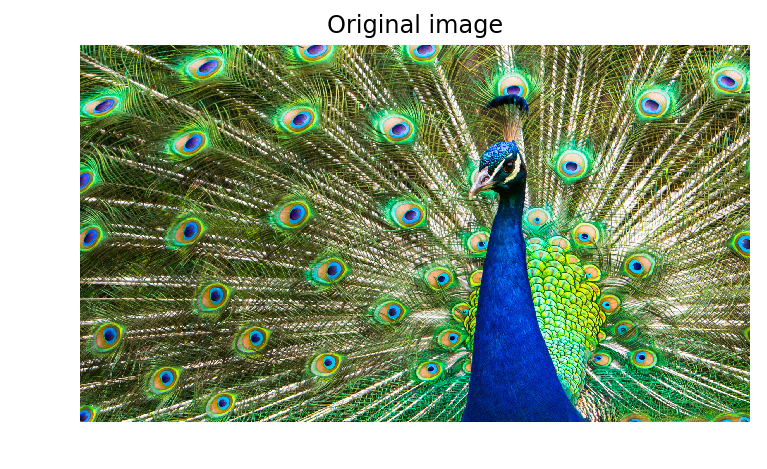

In [2]:
image = load_image('./images/peacock.jpg')

plt.imshow(image)
plt.title('Original image')
plt.axis('off');

# Prepare inputs to be used later

img = apply_transforms(image)

### 2. Use pre-trained models from `torchvision.models`

In [3]:
# A wrapper to help out visualization

def visualize_helper(model_module, tensor=img, k=84):
    model = model_module(pretrained=True)
    backprop = Backprop(model)
    backprop.visualize(tensor, k, guided=True)

#### AlexNet

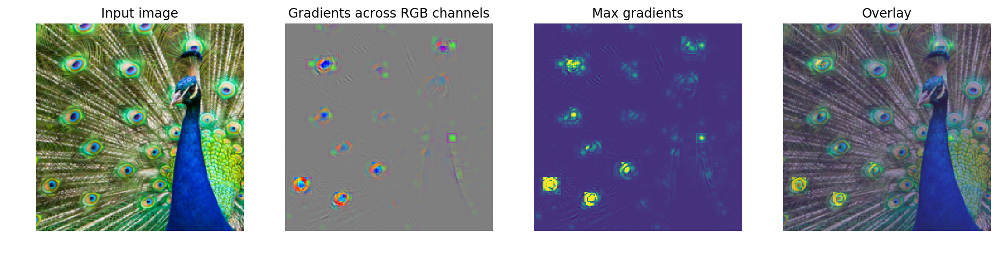

In [4]:
visualize_helper(models.alexnet)

#### VGG-19

In [5]:
visualize_helper(models.vgg19)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /home/huanhuan.gao/.cache/torch/checkpoints/vgg19-dcbb9e9d.pth
  1%|▏         | 7.30M/548M [00:19<23:53, 395kB/s]  


KeyboardInterrupt: 

#### VGG-19 with batch normalization

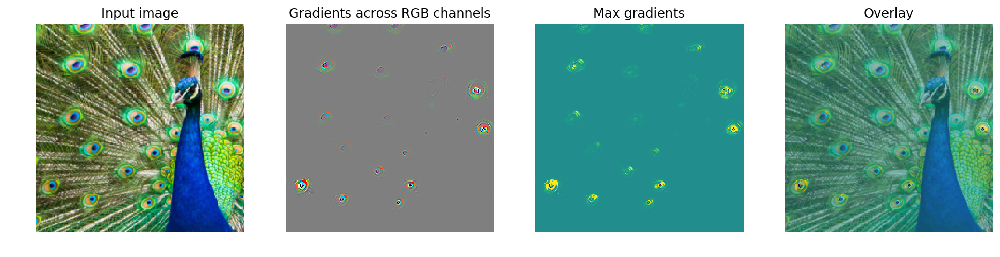

In [7]:
visualize_helper(models.vgg19_bn)

#### ResNet-50

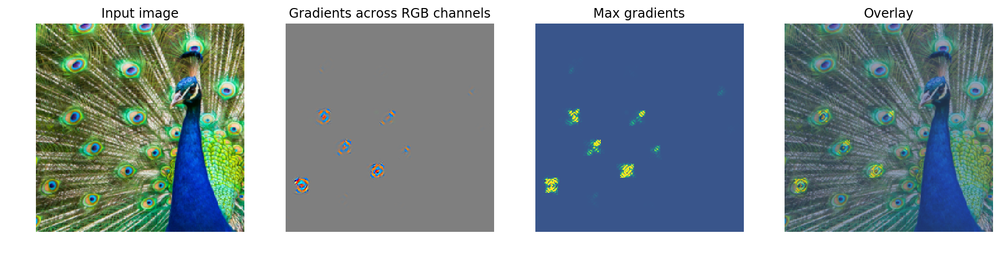

In [8]:
visualize_helper(models.resnet50)

#### ResNet-152

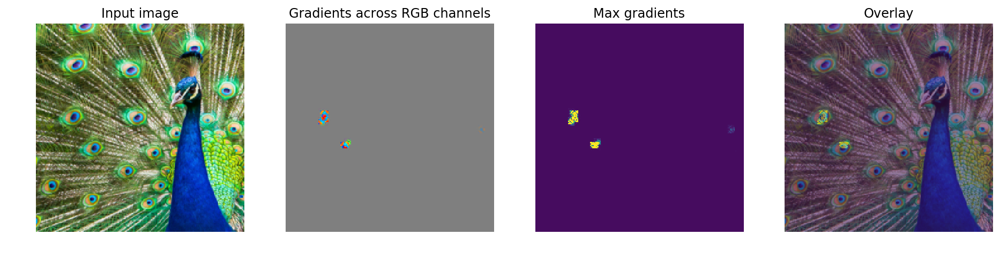

In [9]:
visualize_helper(models.resnet152)

#### SqueezeNet 1.1

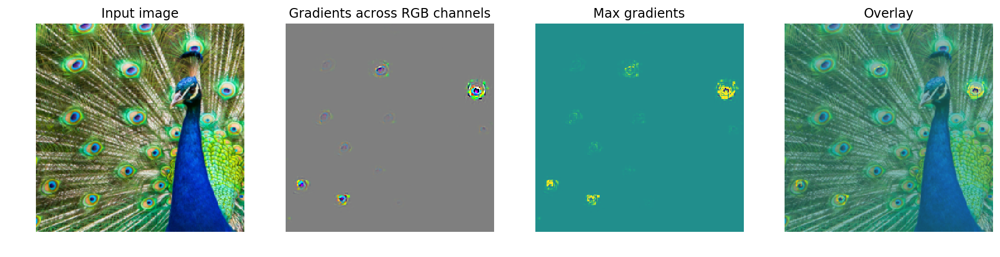

In [10]:
visualize_helper(models.squeezenet1_1)

#### Densenet-121

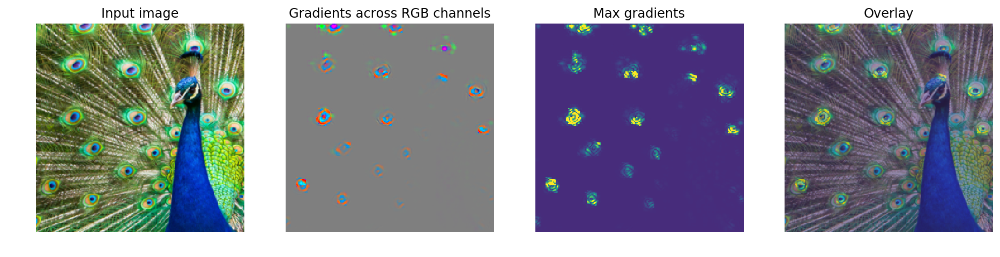

In [11]:
visualize_helper(models.densenet121)

#### Densenet-201

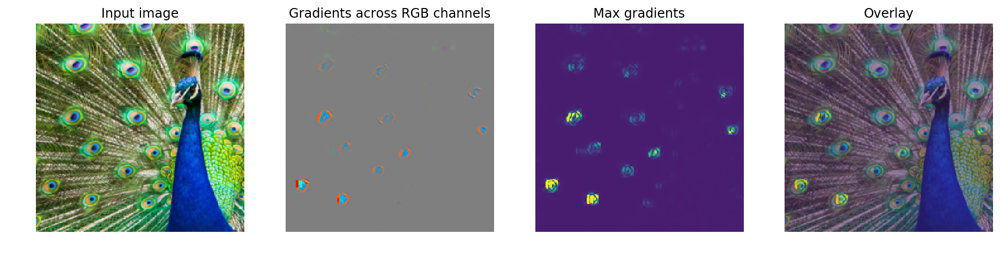

In [12]:
visualize_helper(models.densenet201)

#### Inception v3

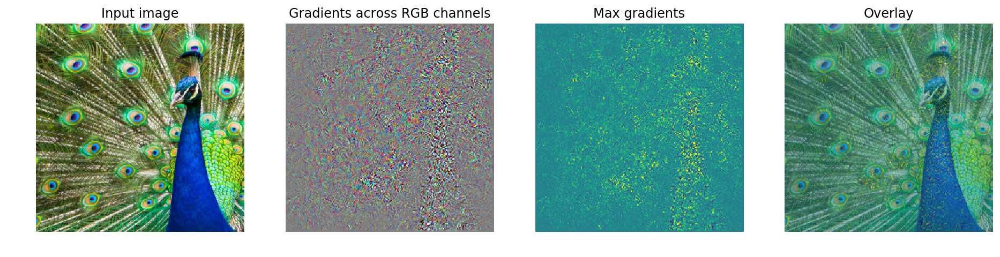

In [13]:
# Image must be 299x299 for Inception models

img_299 = apply_transforms(image, size=299)
visualize_helper(models.inception_v3, img_299)

#### GoogleNet

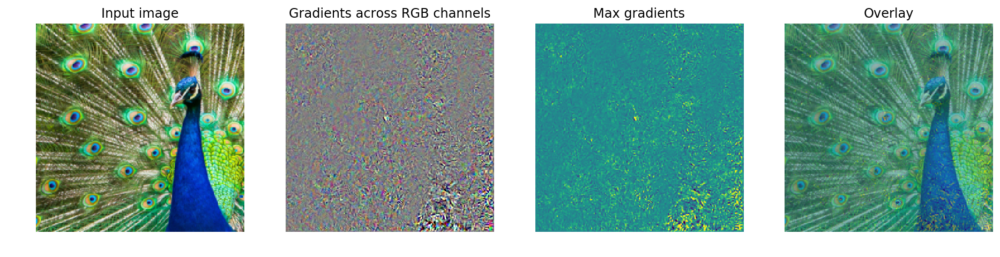

In [14]:
visualize_helper(models.googlenet)

#### ShuffleNet V2

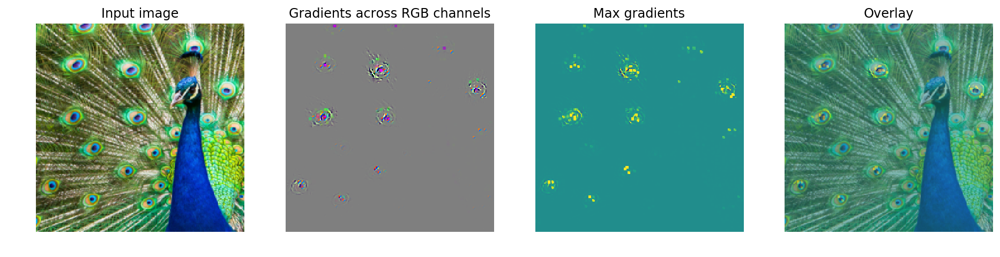

In [15]:
visualize_helper(models.shufflenet_v2_x1_0)

#### MobileNet V2

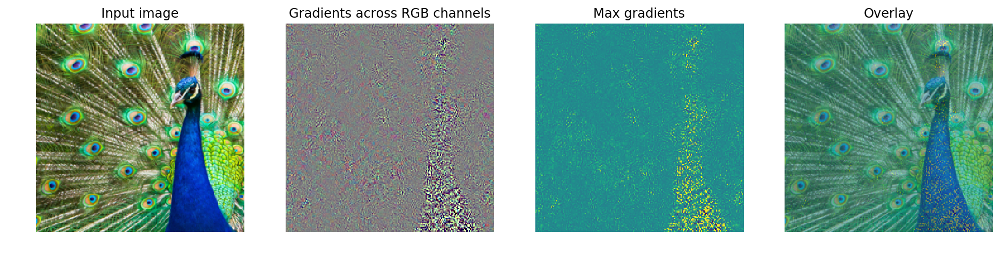

In [16]:
visualize_helper(models.mobilenet_v2)

#### ResNeXt-50-32x4d

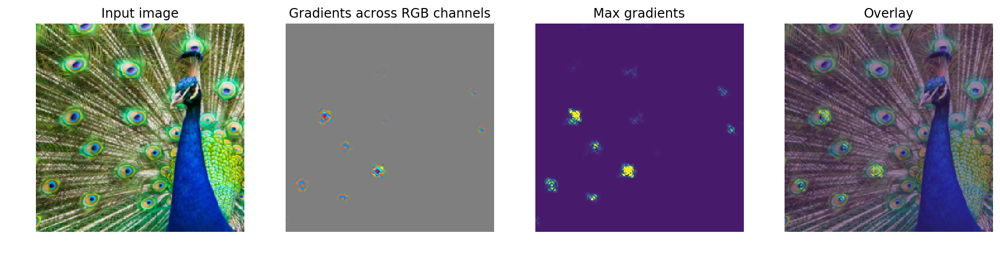

In [17]:
visualize_helper(models.resnext50_32x4d)

#### Wide ResNet-50-2

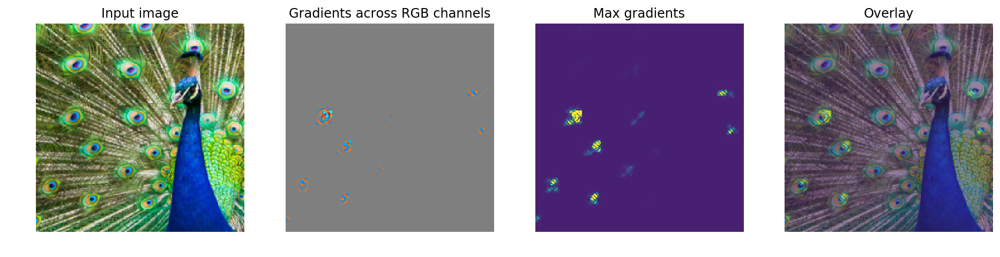

In [18]:
visualize_helper(models.wide_resnet50_2)

#### MNASNet 1.0

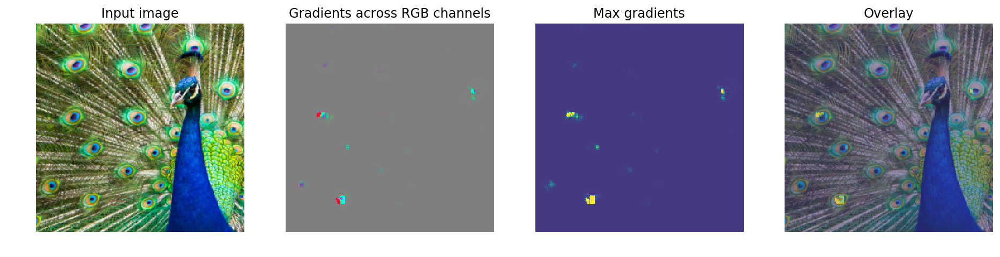

In [19]:
visualize_helper(models.mnasnet1_0)